## snRNA and snATAC joint analysis
**Note:** Portions of the code were adapted from the [Signac vignettes](https://stuartlab.org/signac/articles/overview).


In [1]:

# Install required packages if not already installed
if (!requireNamespace("Seurat", quietly = TRUE)) {
    install.packages("Seurat")
}

if (!requireNamespace("Signac", quietly = TRUE)) {
    install.packages("Signac")
}

if (!requireNamespace("dplyr", quietly = TRUE)) {
    install.packages("dplyr")
}

if (!requireNamespace("ggplot2", quietly = TRUE)) {
    install.packages("ggplot2")
}

if (!requireNamespace("patchwork", quietly = TRUE)) {
    install.packages("patchwork")
}


suppressPackageStartupMessages({
    suppressWarnings({
        library(Seurat)
        library(Signac)
        library(dplyr)
        
        library(ggplot2)
        library(patchwork)
    })
})


### Step 1. RNA-seq/ATAC-seq joint analysis

Read processed ATAC-seq Seurat object

In [2]:
# atac_obj <- readRDS("/lab-share/Neph-Lee-e2/Public/gkim/workshop/01.data/new3/PBMC.ATAC.after_qc.batch_corrected.rds")
atac_obj <- readRDS("PBMC.ATAC.after_qc.batch_corrected.rds")
atac_obj

An object of class Seurat 
130381 features across 20296 samples within 1 assay 
Active assay: ATAC (130381 features, 0 variable features)
 2 layers present: counts, data
 2 dimensional reductions calculated: integrated_lsi, umap

In [3]:
Assays(atac_obj)
Reductions(atac_obj)

[1] "ATAC"

[1] "integrated_lsi" "umap"

In [4]:
colnames(atac_obj@meta.data)

[1] "orig.ident"                        "nCount_ATAC"                      
 [3] "nFeature_ATAC"                     "gex_barcode"                      
 [5] "atac_barcode"                      "is_cell"                          
 [7] "excluded_reason"                   "gex_raw_reads"                    
 [9] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[11] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[13] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[15] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[17] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[19] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[21] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[23] "gex_genes_count"                   "atac_raw_reads"                   
[25] "atac_unmapped_reads"               "atac_lowmapq"                     
[27] "atac_dup_reads"                    "atac_chimeric_reads"              
[29] "atac_mitochondrial_reads"          "atac_fragments"                   
[31] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[33] "atac_peak_region_cutsites"         "dataset"                          
[35] "nucleosome_signal"                 "nucleosome_percentile"            
[37] "TSS.enrichment"                    "TSS.percentile"                   
[39] "blacklist_ratio"                   "barcode"                          
[41] "scDblFinder.cluster"               "scDblFinder.class"                
[43] "scDblFinder.score"                 "scDblFinder.weighted"             
[45] "scDblFinder.difficulty"            "scDblFinder.cxds_score"           
[47] "scDblFinder.mostLikelyOrigin"      "scDblFinder.originAmbiguous"      
[49] "scDblFinder.p"                     "amulet.nFrags"                    
[51] "amulet.uniqFrags"                  "amulet.nAbove2"                   
[53] "amulet.total.nAbove2"              "amulet.p"                         
[55] "amulet.q"                          "combined.p"

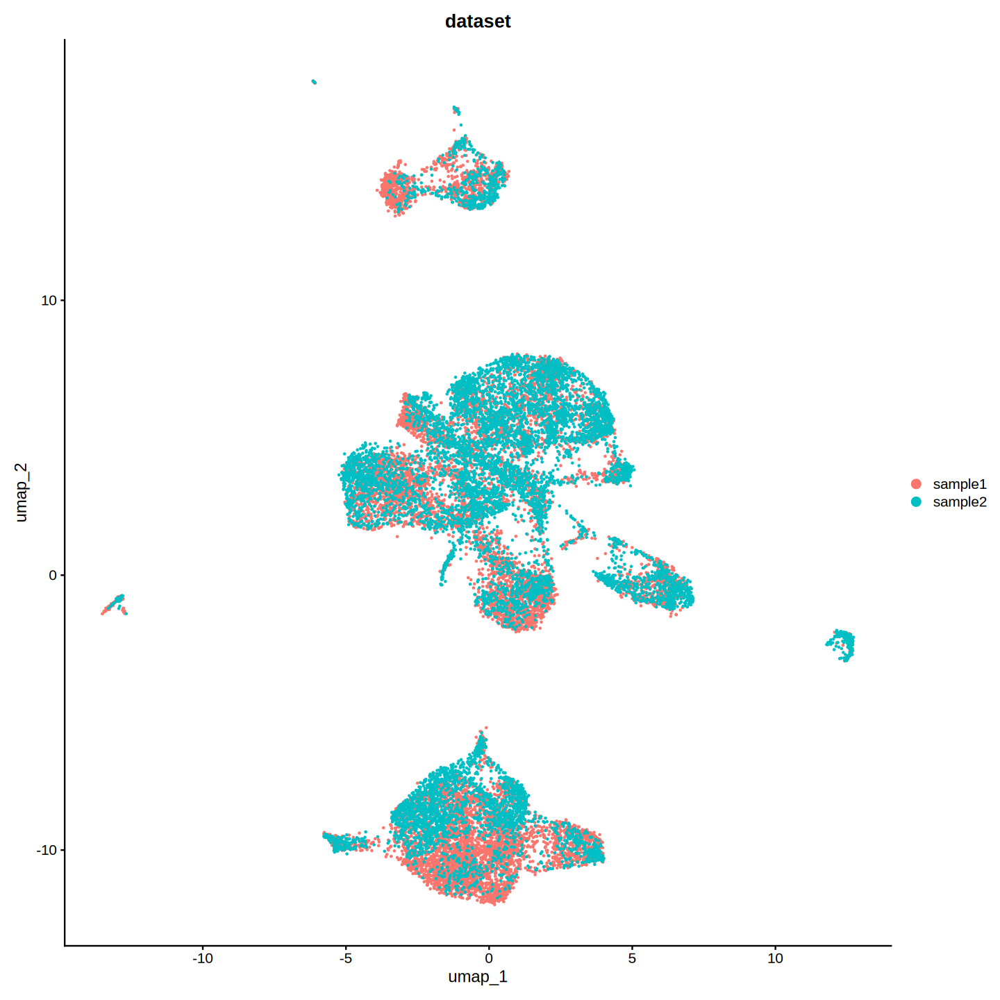

In [5]:
options(repr.plot.width = 12, repr.plot.height = 12)
DimPlot(atac_obj, reduction = "umap", group.by = "dataset", label = FALSE, repel = TRUE)

Read processed RNA-seq object

In [6]:
# rna_obj <- readRDS("/lab-share/Neph-Lee-e2/Public/dnguyen/projects/cdn_workshop/data/PBMC_rna.after_qc.batch_corrected.annotated.rds")
rna_obj <- readRDS("PBMC_rna.after_qc.batch_corrected.annotated.rds")
rna_obj

An object of class Seurat 
287944 features across 17961 samples within 2 assays 
Active assay: SCT (24383 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony_rna, umap

In [7]:
Assays(rna_obj)
Reductions(rna_obj)

[1] "RNA" "SCT"

[1] "pca"         "harmony_rna" "umap"

In [8]:
colnames(rna_obj@meta.data)

[1] "orig.ident"                   "nCount_RNA"                  
 [3] "nFeature_RNA"                 "dataset"                     
 [5] "perc.mt"                      "perc.ribo"                   
 [7] "perc.hb"                      "scDblFinder.cluster"         
 [9] "scDblFinder.class"            "scDblFinder.score"           
[11] "scDblFinder.weighted"         "scDblFinder.difficulty"      
[13] "scDblFinder.cxds_score"       "scDblFinder.mostLikelyOrigin"
[15] "scDblFinder.originAmbiguous"  "scDblFinder.p"               
[17] "barcode"                      "nCount_SCT"                  
[19] "nFeature_SCT"                 "SCT_snn_res.0.8"             
[21] "seurat_clusters"              "annot_cell_type"

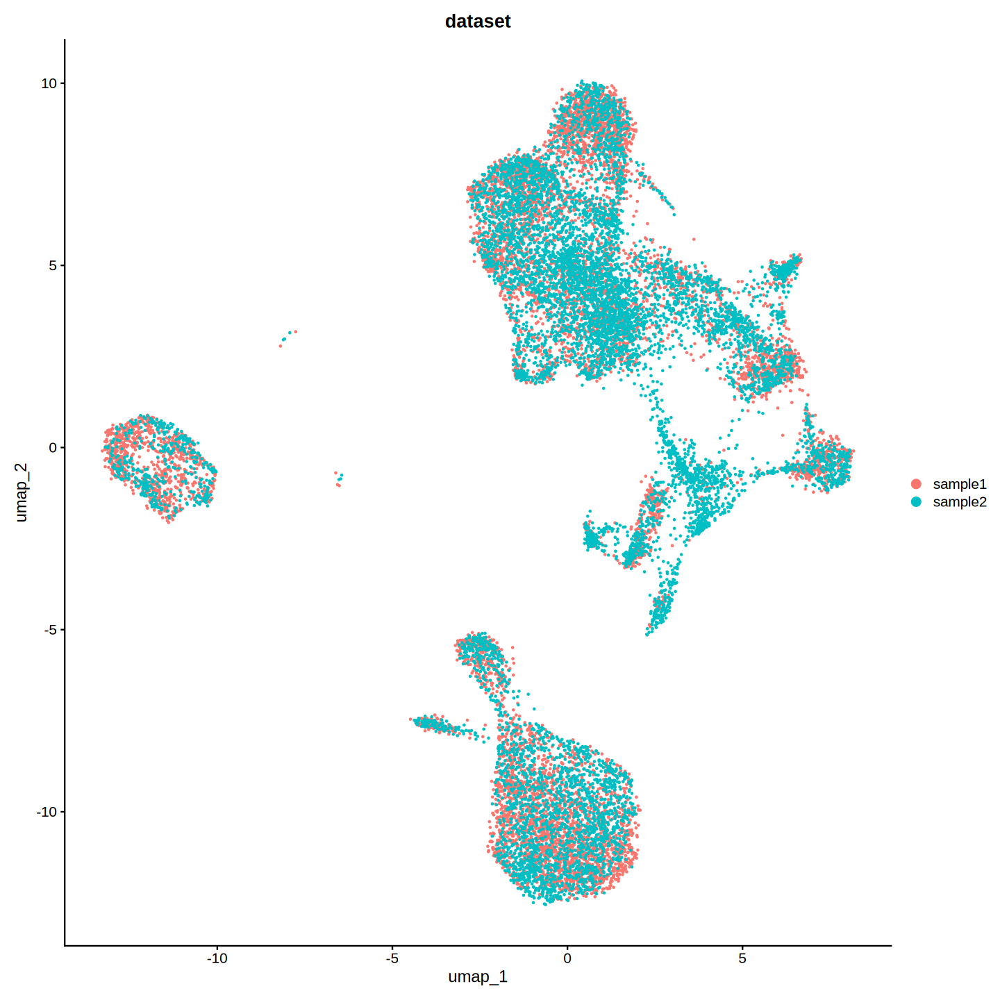

In [9]:
options(repr.plot.width = 12, repr.plot.height = 12)
DimPlot(rna_obj, reduction = "umap", group.by = "dataset", label = FALSE, repel = TRUE)

#### a. Combine two modalities into one Seurat object

Find the cells with both RNA-seq and ATAC-seq data available.

In [10]:

cat(paste0("# cells from RNA-seq: ", length(colnames(rna_obj)), "\n"))

cat(paste0("# cells from ATAC-seq: ", length(colnames(atac_obj)), "\n"))

common_cells <- intersect(colnames(rna_obj), colnames(atac_obj))
cat(paste0("# cells in both RNA-seq and ATAC-seq: ", length(common_cells), "\n"))


# cells from RNA-seq: 17961
# cells from ATAC-seq: 20296
# cells in both RNA-seq and ATAC-seq: 17214


Compute the Jaccard index to quantify the overlap between cells from RNA and ATAC data.

$\text{Jaccard index} = \frac{\text{\# cells in common}}{\text{\# cells in RNA} + \text{\# cells in ATAC} - \text{\# cells in common}}$
- If Jaccard index = 1, cells between two modalities overlap completely.
- If Jaccard index = 0, there is no overlap.

In [11]:
jaccard <- length(common_cells) / (length(colnames(rna_obj)) + length(colnames(atac_obj)) - length(common_cells))
cat(paste0("Jaccard index = ", round(jaccard, 3), "\n"))

Jaccard index = 0.818


Include only cells in common between the two modalities for merging.

In [12]:
rna_merged <- subset(rna_obj, cells = common_cells)
atac_merged <- subset(atac_obj, cells = common_cells)

rna_merged
atac_merged

An object of class Seurat 
287944 features across 17214 samples within 2 assays 
Active assay: SCT (24383 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony_rna, umap

An object of class Seurat 
130381 features across 17214 samples within 1 assay 
Active assay: ATAC (130381 features, 0 variable features)
 2 layers present: counts, data
 2 dimensional reductions calculated: integrated_lsi, umap

Merge two objects into a multi-modal Seurat object

In [13]:

multi_merged <- rna_merged

# Add ATAC assay from ATAC object
multi_merged[["ATAC"]] <- atac_merged[["ATAC"]]

# Add metadata from ATAC object
meta_atac <- atac_merged@meta.data

# Make sure rownames match (critical!)
meta_atac <- meta_atac[Cells(multi_merged), ]

# Combine metadata
multi_merged@meta.data <- cbind(multi_merged@meta.data, meta_atac)

multi_merged


An object of class Seurat 
418325 features across 17214 samples within 3 assays 
Active assay: SCT (24383 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, ATAC
 3 dimensional reductions calculated: pca, harmony_rna, umap

In [14]:
# copy dimensionality reductions from ATAC-seq object

# integrated LSI
multi_merged[["atac.integrated_lsi"]] <- atac_merged[["integrated_lsi"]]

# UMAP
multi_merged[["atac.umap"]] <- atac_merged[["umap"]]

multi_merged


Warning message:
“Key ‘umap_’ taken, using ‘atacumap_’ instead”


An object of class Seurat 
418325 features across 17214 samples within 3 assays 
Active assay: SCT (24383 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, ATAC
 5 dimensional reductions calculated: pca, harmony_rna, umap, atac.integrated_lsi, atac.umap

In [15]:

# rename UMAP dimensional reduction from RNA to avoid confusion
multi_merged[["rna.umap"]] <- multi_merged[["umap"]]
multi_merged[["umap"]] <- NULL

multi_merged


Warning message:
“Key ‘umap_’ taken, using ‘rnaumap_’ instead”


An object of class Seurat 
418325 features across 17214 samples within 3 assays 
Active assay: SCT (24383 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, ATAC
 5 dimensional reductions calculated: pca, harmony_rna, atac.integrated_lsi, atac.umap, rna.umap

##### Check batch effect (if existed) in RNA and ATAC objects

Plot the UMAP grouped by samples to check if any potential batch effects remained after harmonization on each modality.

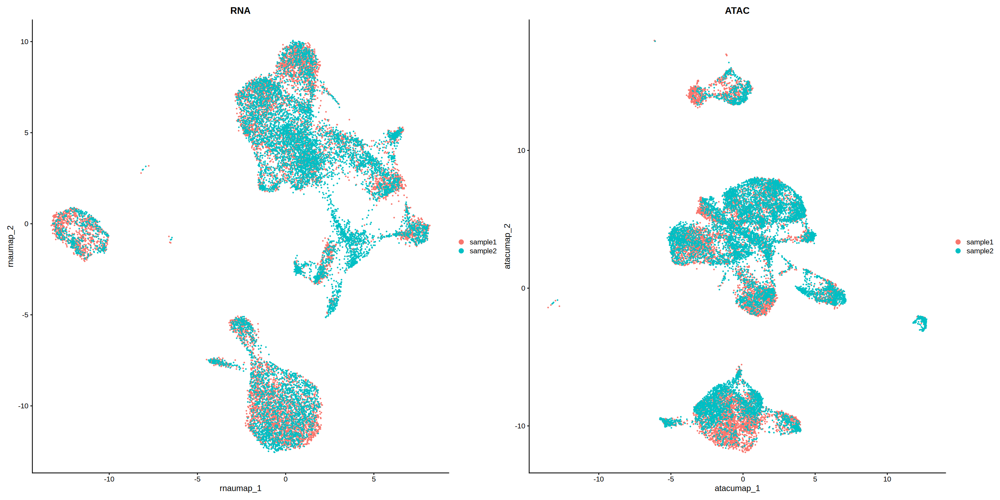

In [16]:
options(repr.plot.width = 24, repr.plot.height = 12)
p1 <- DimPlot(multi_merged, reduction = "rna.umap", group.by = "dataset", label = FALSE, repel = TRUE)
p2 <- DimPlot(multi_merged, reduction = "atac.umap", group.by = "dataset", label = FALSE, repel = TRUE)

(p1 + ggtitle("RNA")) + (p2 + ggtitle("ATAC"))

##### Check cell type annotation on UMAPs for both modalities

For single-cell multiome data, it is easier to use the RNA-seq modality for cell type annotation, rather than ATAC-seq.

Gene expression profiles from RNA-seq are generally more informative and interpretable for identifying cell types, especially using known marker genes.

Below, we plot the UMAP from two modalitiees, colored by cell type annotation from RNA-seq.

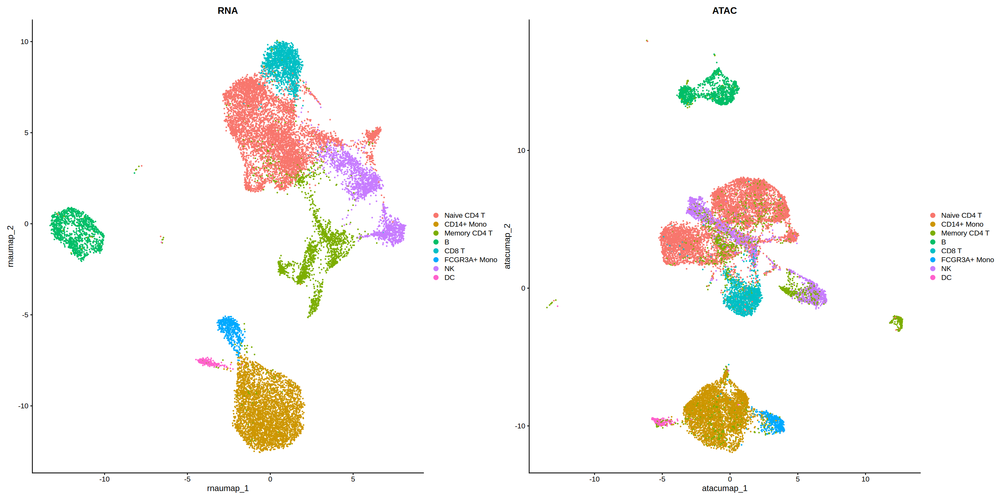

In [17]:
options(repr.plot.width = 24, repr.plot.height = 12)
p3 <- DimPlot(multi_merged, reduction = "rna.umap", group.by = "annot_cell_type", label = FALSE, repel = TRUE)
p4 <- DimPlot(multi_merged, reduction = "atac.umap", group.by = "annot_cell_type", label = FALSE, repel = TRUE)

(p3 + ggtitle("RNA")) + (p4 + ggtitle("ATAC"))

#### b. Perform weighted nearest neighbor (WNN) analysis on RNA-seq and ATAC-seq

We use Weighted Nearest Neighbor (WNN) analysis to **combine information from RNA and ATAC** by learning how much each modality contributes to defining cellular identity.

This allows us to build an integrated representation of cells that captures both transcriptional and regulatory features.

For each cell, the `FindMultiModalNeighbors()` function computes its closest neighbors in the dataset based on a weighted combination of RNA and ATAC similarities. 

Arguments:
- `reduction.list`: a list of two dimensional reductions, one for each of the modalities to be integrated
- `dims.list`: a list containing the dimensions for each reduction to use
- `k.nn`: the number of multimodal neighbors to compute (20 by default)
- etc


The output will be stored in the neighbors layer of the Seurat object and can be accessed using `[['weighted.nn']]`.

The WNN graph can be accessed at `[["wknn"]]`, and the SNN graph used for clustering at `[["wsnn"]]`.


In [18]:
Reductions(multi_merged)

[1] "pca"                 "harmony_rna"         "atac.integrated_lsi"
[4] "atac.umap"           "rna.umap"

In [19]:

DefaultAssay(multi_merged) <- "SCT"

multi_merged <- FindMultiModalNeighbors(
    object = multi_merged,
    reduction.list = list("harmony_rna", "atac.integrated_lsi"),
    dims.list = list(1:50, 2:30),
    verbose = TRUE
)


Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.

Calculating kernel bandwidths

Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph



In [20]:
multi_merged[["weighted.nn"]]

A Neighbor object containing the 20 nearest neighbors for 17214 cells

In [21]:
multi_merged[["wknn"]]

A Graph object containing 17214 cells

In [22]:
multi_merged[["wsnn"]]

A Graph object containing 17214 cells

In [23]:
wsnn_graph <- as.matrix(multi_merged[["wsnn"]])
dim(wsnn_graph)
wsnn_graph |> head()

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.2 GiB”


[1] 17214 17214

,sample1_AAACAGCCAGAATGAC-1,sample1_AAACAGCCAGCTACGT-1,sample1_AAACAGCCAGGCCTTG-1,sample1_AAACATGCAGCAATAA-1,sample1_AAACATGCAGCCAGAA-1,sample1_AAACATGCAGGCGATA-1,sample1_AAACATGCAGTTTCTC-1,sample1_AAACCAACAACTAGGG-1,sample1_AAACCAACAATAACCT-1,sample1_AAACCAACAGGACCTT-1,⋯,sample2_TTTGTGGCAGTTTGTG-1,sample2_TTTGTGGCATGTCAGC-1,sample2_TTTGTGGCATTAAACC-1,sample2_TTTGTGGCATTAGGTT-1,sample2_TTTGTGGCATTGCGTA-1,sample2_TTTGTGTTCAAGCGCC-1,sample2_TTTGTGTTCGTTTCCA-1,sample2_TTTGTTGGTACCCACC-1,sample2_TTTGTTGGTACCGAAC-1,sample2_TTTGTTGGTAGGATTT-1
sample1_AAACAGCCAGAATGAC-1,1.00000000,0,0.08108108,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
sample1_AAACAGCCAGCTACGT-1,0.00000000,1,0.00000000,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
sample1_AAACAGCCAGGCCTTG-1,0.08108108,0,1.00000000,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
sample1_AAACATGCAGCAATAA-1,0.00000000,0,0.00000000,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
sample1_AAACATGCAGCCAGAA-1,0.00000000,0,0.00000000,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
sample1_AAACATGCAGGCGATA-1,0.00000000,0,0.00000000,0,0,1,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


Run UMAP on Weighted Nearest Neighbor results stored in `weighted.nn` layer.

In [24]:
multi_merged <- RunUMAP(
    object = multi_merged,
    nn.name = "weighted.nn",
    reduction.name = "wnn.umap",
    verbose = TRUE
)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
17:26:26 UMAP embedding parameters a = 0.9922 b = 1.112

17:26:27 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 20

17:26:29 Initializing from normalized Laplacian + noise (using RSpectra)

17:26:29 Commencing optimization for 200 epochs, with 513332 positive edges

17:26:29 Using rng type: pcg

17:26:39 Optimization finished



In [25]:
Reductions(multi_merged)

[1] "pca"                 "harmony_rna"         "atac.integrated_lsi"
[4] "atac.umap"           "rna.umap"            "wnn.umap"

Visualize the plot made from running UMAP on Weighted Nearest Neighbor results.

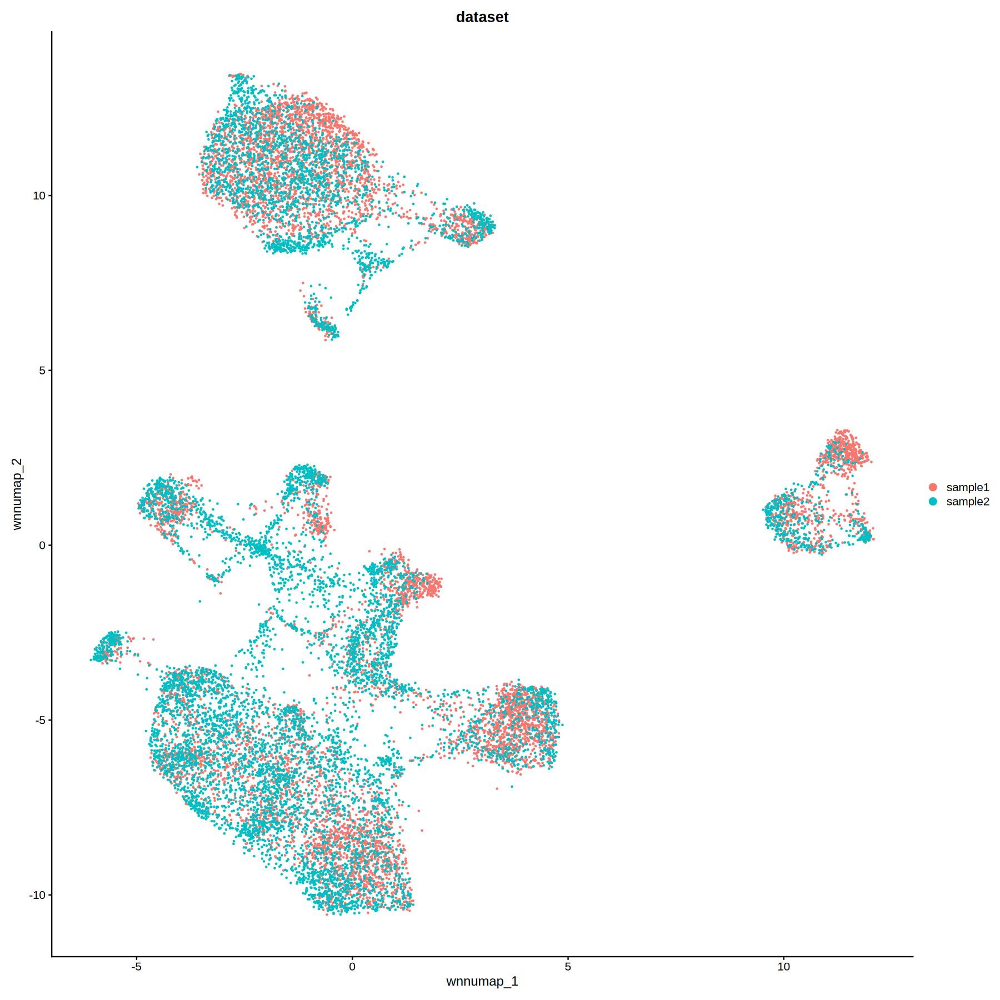

In [26]:

# color by batch/sample
options(repr.plot.width = 15, repr.plot.height = 15)
DimPlot(multi_merged, reduction = "wnn.umap", group.by = 'dataset')


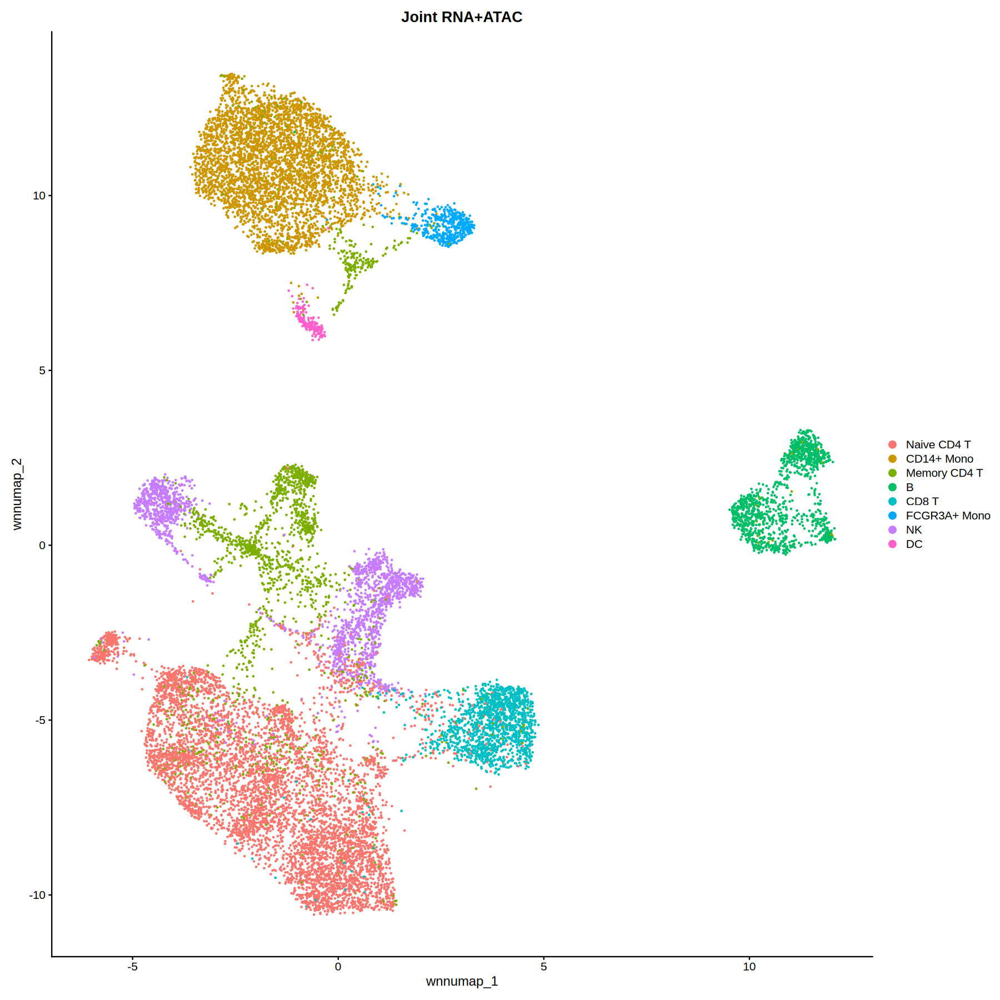

In [27]:

# color by cell type
options(repr.plot.width=15, repr.plot.height=15)
p5 <- DimPlot(multi_merged, reduction = "wnn.umap", group.by = 'annot_cell_type')
p5 + ggtitle("Joint RNA+ATAC")


### Step 2. Cell type annotation using both modalities

Put UMAP plots made from RNA-seq, ATAC-seq, and both modalities side-by-side for comparison.

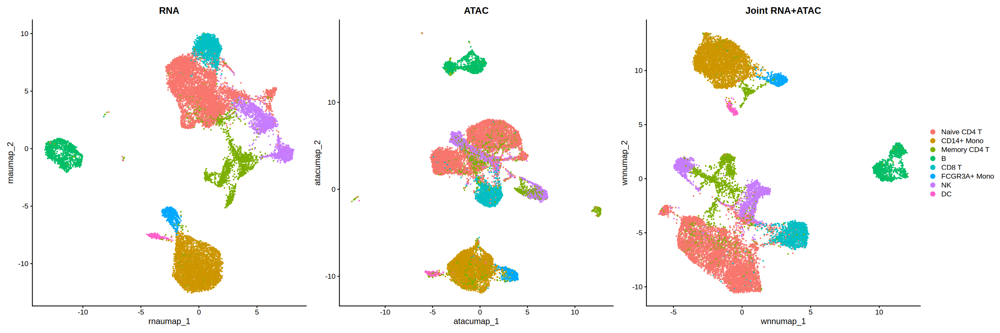

In [28]:

options(repr.plot.width=24, repr.plot.height=8)
(p3 + ggtitle("RNA") + NoLegend()) | (p4 + ggtitle("ATAC") + NoLegend()) | (p5 + ggtitle("Joint RNA+ATAC"))



Notice that RNA clusters, ATAC clusters, and joint clusters are not the same.
There is a cluster showing gene expression profile of Memory CD4 T cells, but chromatin accessibility profile of monocytes.
This cluster is only separable from other T cells when we combine both modalities.


In order to annotate the new clusters maded by joint RNA/ATAC-seq, we run `FindClusters()` function.

Arguments:
- `algorithm`: 1 = original Louvain algorithm; 2 = Louvain algorithm with multilevel refinement; 3 = SLM algorithm; 4 = Leiden algorithm
- `graph.name`: name of graph to use for the clustering algorithm (for WNN analysis, we use `wsnn`)
- `resolution`: use a value above 1.0 if you want to obtain a larger number of clusters, otherwise you obtain a smaller number of clusters
- etc


In [29]:
multi_merged <- FindClusters(multi_merged, algorithm=3, graph.name = "wsnn", resolution = 0.8)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17214
Number of edges: 615748

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.9024
Number of communities: 22
Elapsed time: 8 seconds


After you run `FindClusters()` function, a new column containing cluster indinces of cells should be added to the `meta.data` dataframe.

In [30]:
colnames(multi_merged@meta.data)

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "dataset"                          
 [5] "perc.mt"                           "perc.ribo"                        
 [7] "perc.hb"                           "scDblFinder.cluster"              
 [9] "scDblFinder.class"                 "scDblFinder.score"                
[11] "scDblFinder.weighted"              "scDblFinder.difficulty"           
[13] "scDblFinder.cxds_score"            "scDblFinder.mostLikelyOrigin"     
[15] "scDblFinder.originAmbiguous"       "scDblFinder.p"                    
[17] "barcode"                           "nCount_SCT"                       
[19] "nFeature_SCT"                      "SCT_snn_res.0.8"                  
[21] "seurat_clusters"                   "annot_cell_type"                  
[23] "nCount_ATAC"                       "nFeature_ATAC"                    
[25] "orig.ident.1"                      "nCount_ATAC.1"                    
[27] "nFeature_ATAC.1"                   "gex_barcode"                      
[29] "atac_barcode"                      "is_cell"                          
[31] "excluded_reason"                   "gex_raw_reads"                    
[33] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[35] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[37] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[39] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[41] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[43] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[45] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[47] "gex_genes_count"                   "atac_raw_reads"                   
[49] "atac_unmapped_reads"               "atac_lowmapq"                     
[51] "atac_dup_reads"                    "atac_chimeric_reads"              
[53] "atac_mitochondrial_reads"          "atac_fragments"                   
[55] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[57] "atac_peak_region_cutsites"         "dataset.1"                        
[59] "nucleosome_signal"                 "nucleosome_percentile"            
[61] "TSS.enrichment"                    "TSS.percentile"                   
[63] "blacklist_ratio"                   "barcode.1"                        
[65] "scDblFinder.cluster.1"             "scDblFinder.class.1"              
[67] "scDblFinder.score.1"               "scDblFinder.weighted.1"           
[69] "scDblFinder.difficulty.1"          "scDblFinder.cxds_score.1"         
[71] "scDblFinder.mostLikelyOrigin.1"    "scDblFinder.originAmbiguous.1"    
[73] "scDblFinder.p.1"                   "amulet.nFrags"                    
[75] "amulet.uniqFrags"                  "amulet.nAbove2"                   
[77] "amulet.total.nAbove2"              "amulet.p"                         
[79] "amulet.q"                          "combined.p"                       
[81] "SCT.weight"                        "ATAC.weight"                      
[83] "wsnn_res.0.8"

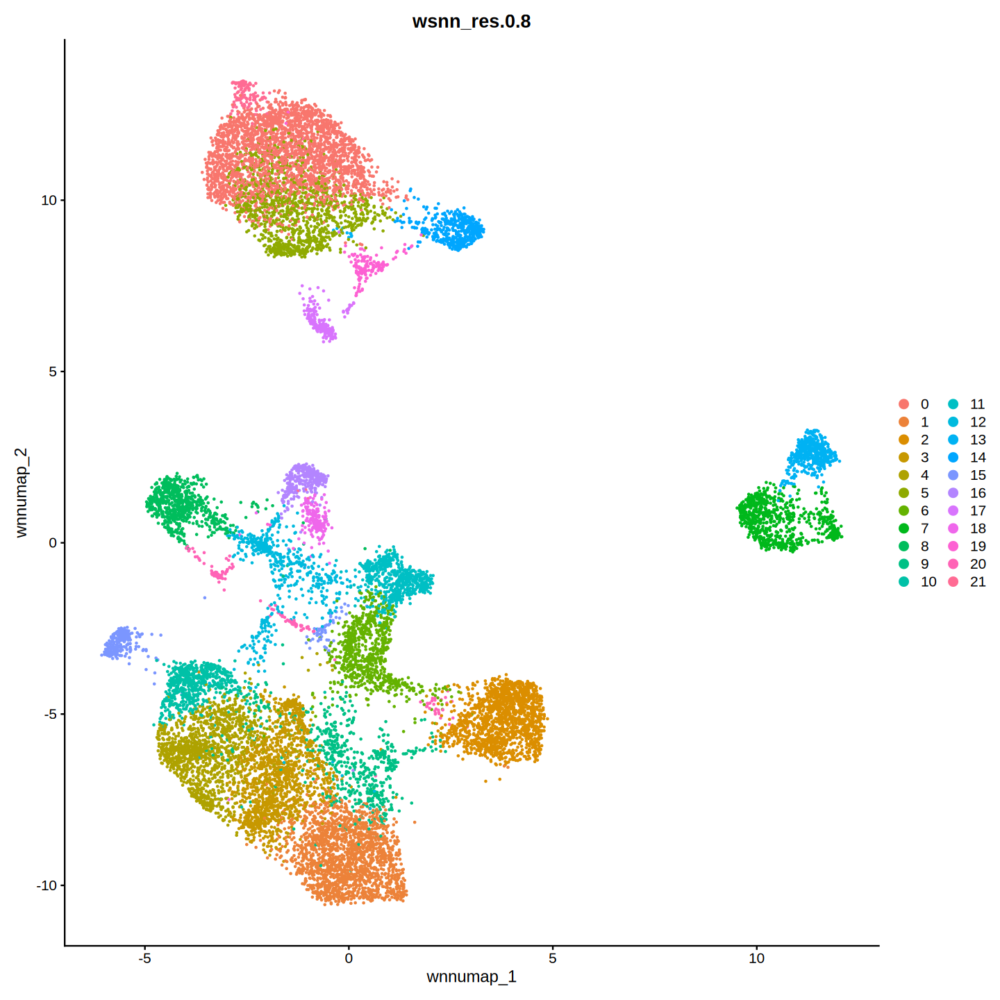

In [31]:
options(repr.plot.width = 12, repr.plot.height = 12)
default_res_plot <- DimPlot(multi_merged, reduction = "wnn.umap", group.by = 'wsnn_res.0.8')
default_res_plot

Increase the resolution to separate big clusters into multiple subclusters.

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17214
Number of edges: 615748

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8648
Number of communities: 28
Elapsed time: 7 seconds


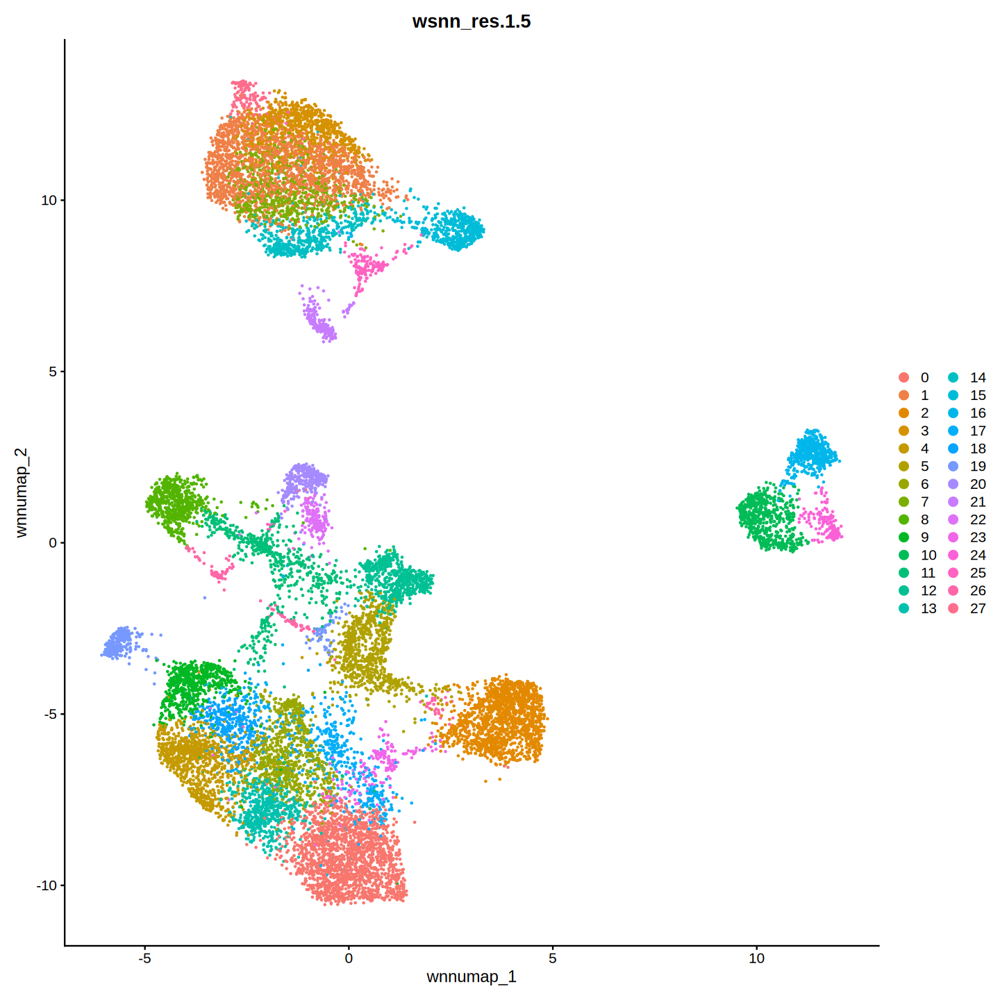

In [32]:

multi_merged <- FindClusters(multi_merged, algorithm=3, graph.name = "wsnn", resolution = 1.5)

options(repr.plot.width = 12, repr.plot.height = 12)
high_res_plot <- DimPlot(multi_merged, reduction = "wnn.umap", group.by = 'wsnn_res.1.5')
high_res_plot


We can also decrease the resolution to remove unnesssary small clusters.

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17214
Number of edges: 615748

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.9459
Number of communities: 13
Elapsed time: 9 seconds


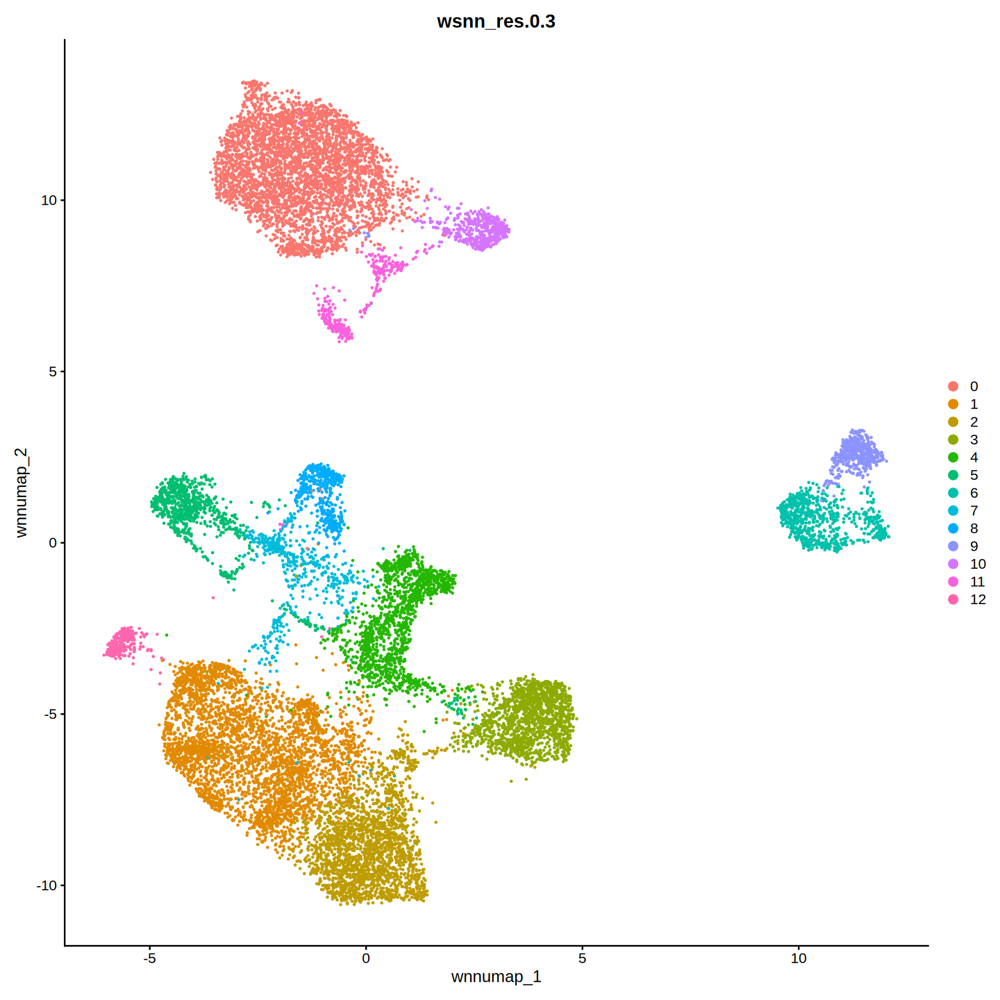

In [33]:

multi_merged <- FindClusters(multi_merged, algorithm=3, graph.name = "wsnn", resolution = 0.3)
options(repr.plot.width = 12, repr.plot.height = 12)
low_res_plot <- DimPlot(multi_merged, reduction = "wnn.umap", group.by = 'wsnn_res.0.3')
low_res_plot


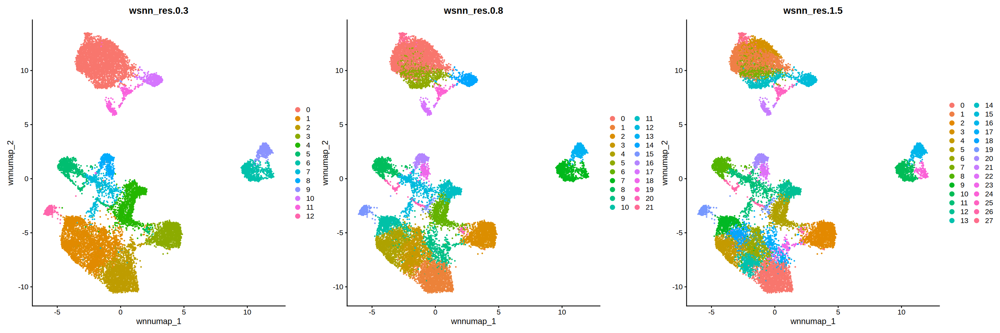

In [34]:
options(repr.plot.width = 24, repr.plot.height = 8)
low_res_plot + default_res_plot + high_res_plot

*How to know which resolution to use?*

We used marker genes to see which clustering results actually separate cells with distinct marker genes.


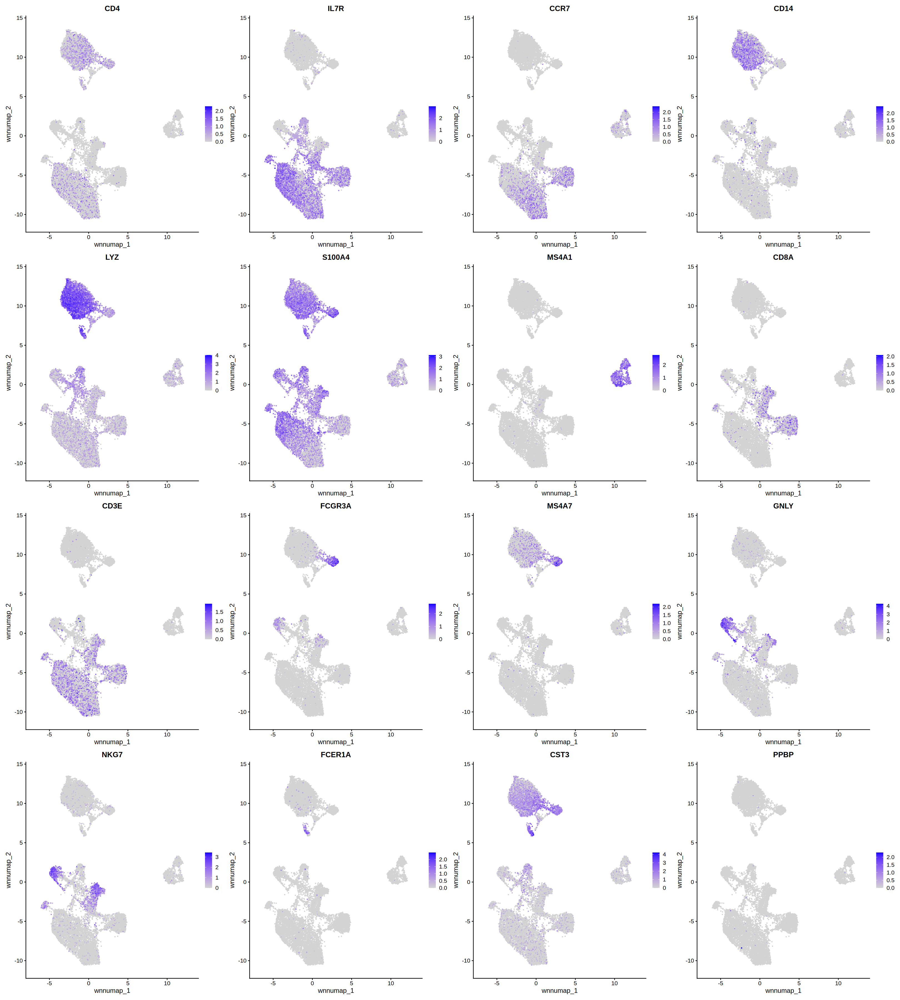

In [35]:

options(repr.plot.width = 27, repr.plot.height = 30)

FeaturePlot(multi_merged, reduction = "wnn.umap",
                                    features = c("CD4",
                                     "IL7R", "CCR7",   # Naive CD4+ T
                                     "CD14", "LYZ",    # CD14+ Mono
                                     "IL7R", "S100A4", # Memory CD4+ T
                                     "MS4A1",          # B 
                                     "CD8A", "CD3E",   # CD8+ T
                                     "FCGR3A", "MS4A7",# FCGR3A+ Mono
                                     "GNLY", "NKG7",   # NK
                                     "FCER1A", "CST3", # DC
                                     "PPBP"            # Platelet
                              ))



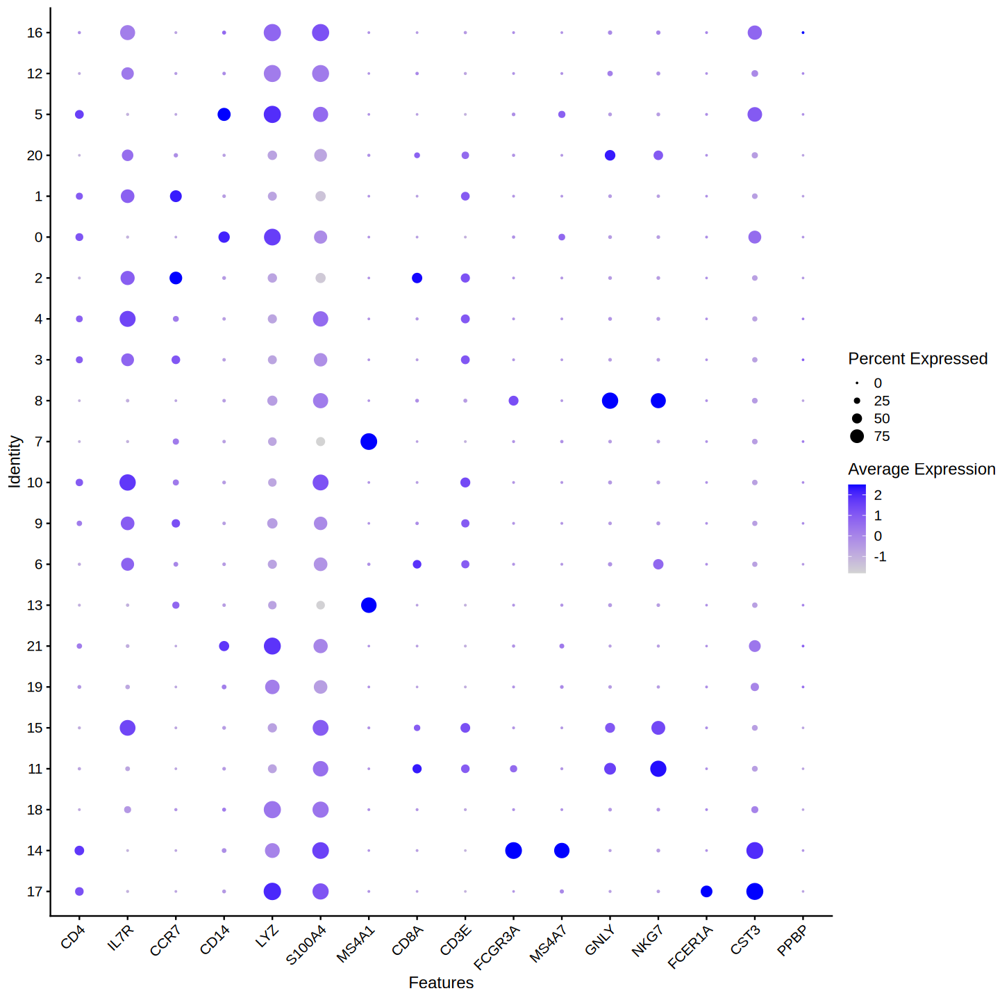

In [36]:

options(repr.plot.width = 12, repr.plot.height = 12)
DotPlot(multi_merged, features=c("CD4",
                                     "IL7R", "CCR7",   # Naive CD4+ T
                                     "CD14", "LYZ",    # CD14+ Mono
                                     "S100A4", # Memory CD4+ T
                                     "MS4A1",          # B 
                                     "CD8A", "CD3E",   # CD8+ T
                                     "FCGR3A", "MS4A7",# FCGR3A+ Mono
                                     "GNLY", "NKG7",   # NK
                                     "FCER1A", "CST3", # DC
                                     "PPBP"            # Platelet
                              ), cluster.idents=T, group.by = 'wsnn_res.0.8') + RotatedAxis()

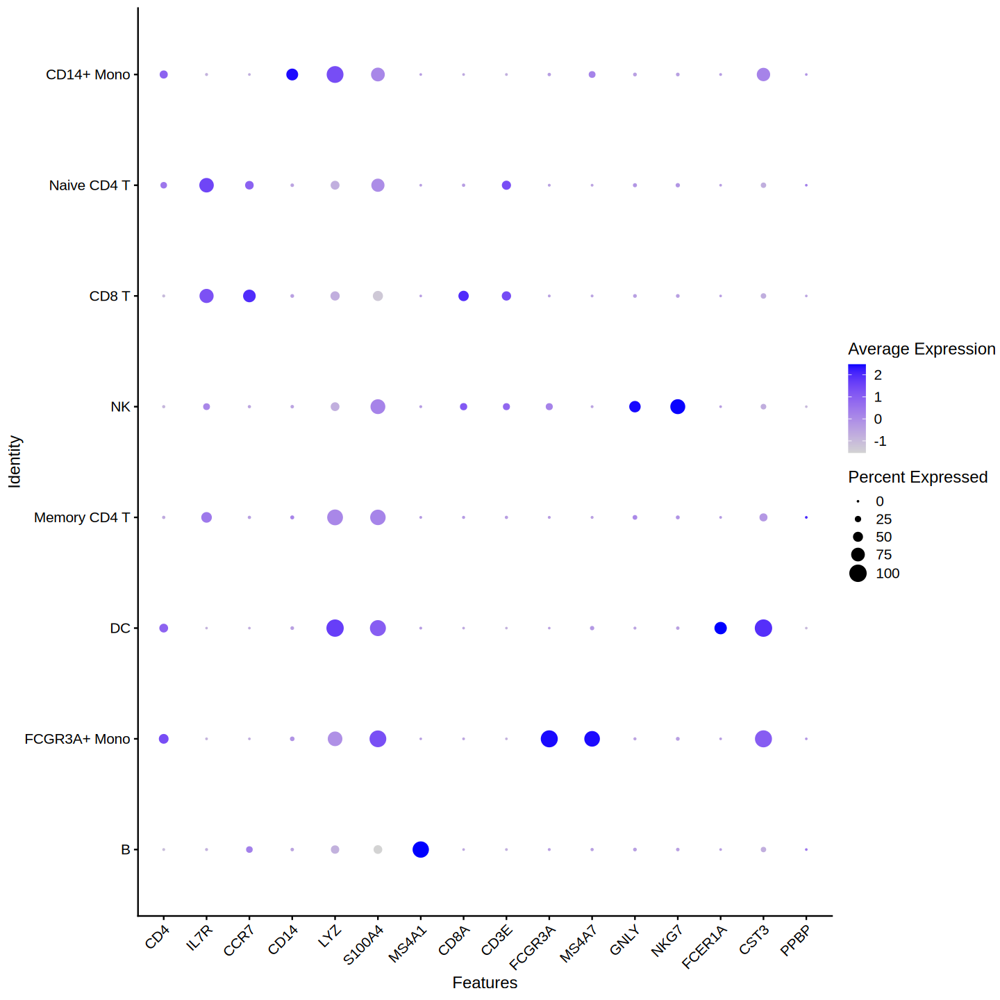

In [37]:

options(repr.plot.width = 12, repr.plot.height = 12)
DotPlot(multi_merged, features=c("CD4",
                                     "IL7R", "CCR7",   # Naive CD4+ T
                                     "CD14", "LYZ",    # CD14+ Mono
                                     "S100A4", # Memory CD4+ T
                                     "MS4A1",          # B 
                                     "CD8A", "CD3E",   # CD8+ T
                                     "FCGR3A", "MS4A7",# FCGR3A+ Mono
                                     "GNLY", "NKG7",   # NK
                                     "FCER1A", "CST3", # DC
                                     "PPBP"            # Platelet
                              ), cluster.idents=T, group.by = 'annot_cell_type') + RotatedAxis()

In [38]:
# saveRDS(multi_merged, "../data/PBMC.joint.rds")
# saveRDS(multi_merged, "PBMC.joint.rds")

In [39]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Rocky Linux 8.10 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /home/ch260976/.conda/envs/jlab/lib/libopenblasp-r0.3.27.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] patchwork_1.3.0    ggplot2_3.5.1      dplyr_1.1.4        Signac_1.14.0     
[5] Seurat_5.2.1       SeuratObject_5.0.2 sp_2.2-0          

loaded via a namespace (and not attached):
  [1] RColorBrewer_1.1-3 